<a href="https://colab.research.google.com/github/lizhieffe/RL_practicing/blob/main/RL_PPO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Tutorial: https://www.youtube.com/watch?v=HlKHCg6rz0s

- This colab demonstrated PPO, using Procgen games as environment.

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


In [2]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


# Motivations

Problems with "Vanilla" Actor-Critic Methods

- Value estimate used for calculating Advantage can introduce bias.
  - Slow to converge.
  - May not converge at all.

- Can't perform many update steps between rollouts.
  - Overfit value function.
  - Change action probabilities too much.

- The buffered trajectory can only be used for improving the same policy where it was rollout.

# Basic Actor-Critic

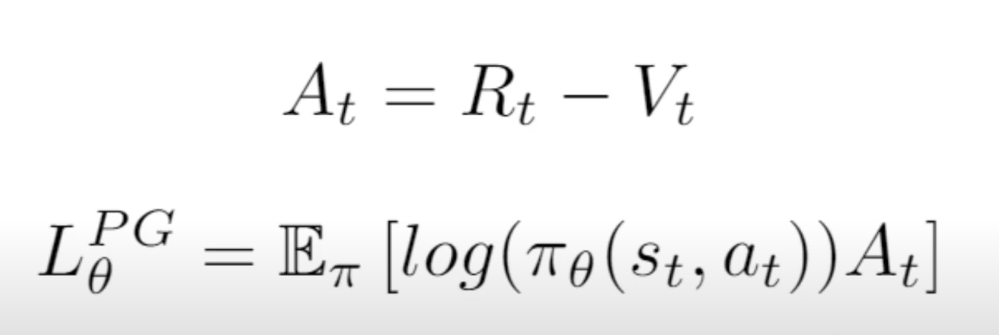

# Improvement to make (TRPO, GAE, PPO)

- Trust Region Policy Optimization (TRPO)

  - Limit how much our current policy can differ from the old policy during training step.

- Generalized Advantage Estimation (GAE)

  - Balancing noise and bias when calculating Advantage.

- Proximal Policy Optimization (PPO)

  - Easy to implement approximation of TRPO.

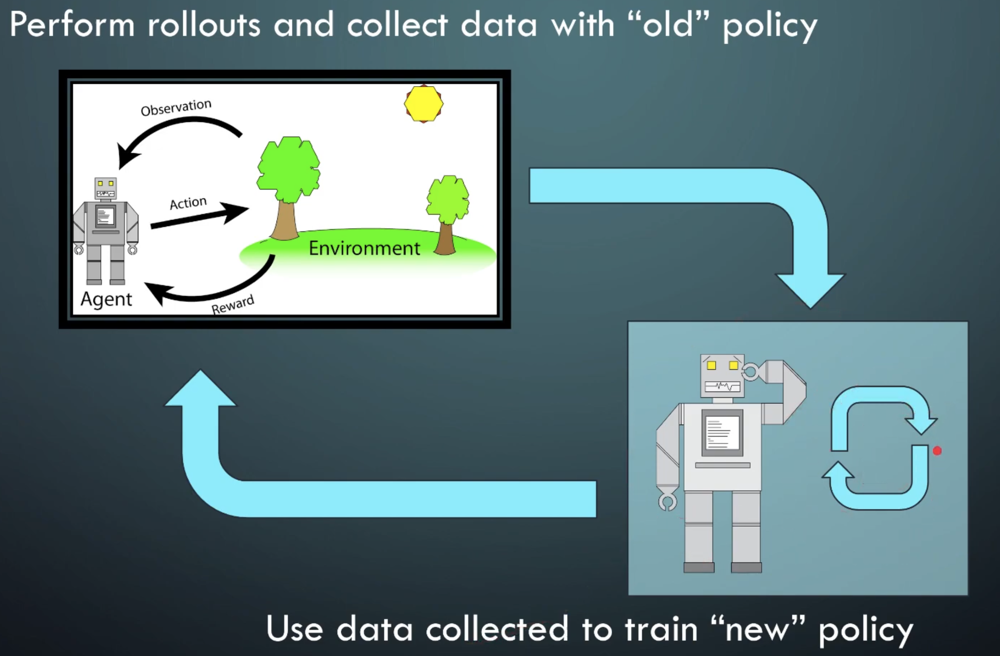

# TRPO

TRPO introduces a "Trust Region"

Alternative name: it seems it is referred to **CPI** (Conservative Policy Iteration) sometimes especially in equations.

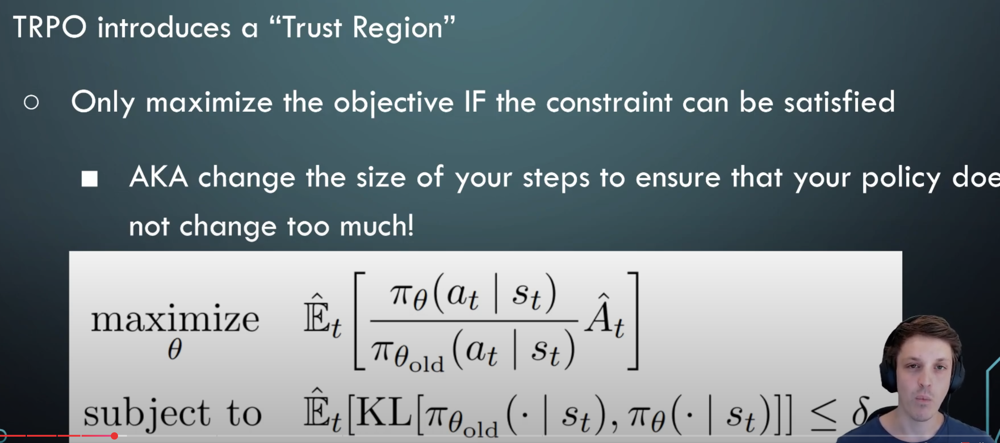

Note:

1. The denominator in the first equation is based on the theory about how to improve the current policy using the trajectory collected from **any** sampling methods.

  - e.g. an old version of policy, or even a very different implementation of the policy.

2. The constrain term says: the probability distribution over the actions for a given state between the old and new policies are constrained.

How to satisfy the constaint? Several ways:

1. Always check the constraint is satisfied.

2. TRPO impl is more complicated. Roughly speaking, it first learns the relation between the step size and the distance to reach the constraint, then choose a proper step. This is complicated to implement for deep network policy.



# GAE

The advangate estimation is less noisy by combining using the returns approximation from TD learning and "real" (e.g. MC) returns update.

Physical meaning:

- In the 1st equation, it can seen that the GAE is the sum of TD-error on all time steps.


**Gamma** is the decay rate of future reward, 0 < gamma < 1

**Tao** is the decay rate of the sum of TD-erros, 0 < tao < 1
- When tao=0, GAE_0 is equiavlent to TD -> high bias, low variance
- When tao=1, GAE_1 is equivalent to MC -> low bias, high variance

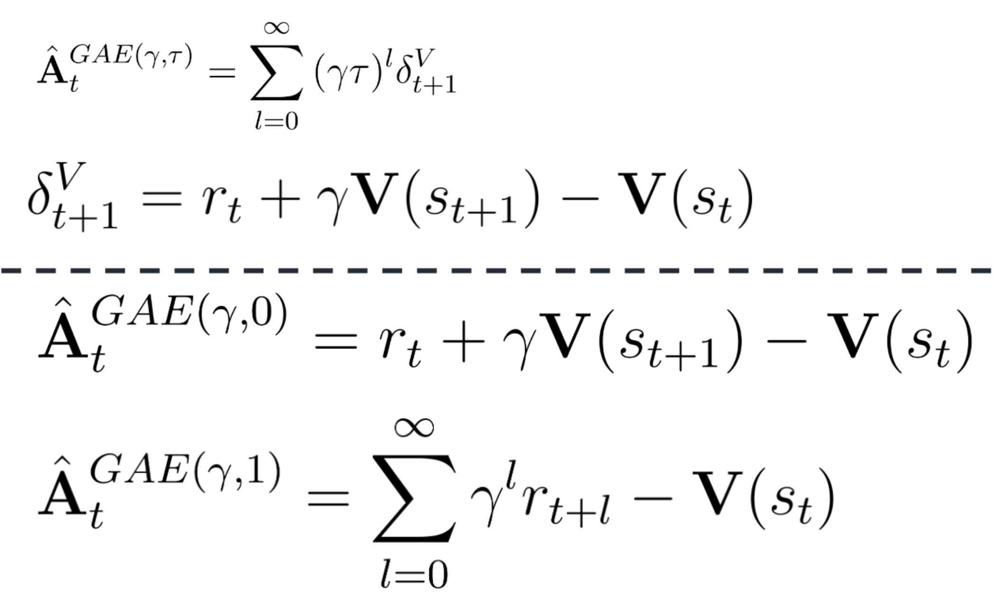

It also introduces **Trust Region** for the **Value** function

- In practice, it often just add the 1st eq in the loss, without having the 2nd eq constraint.

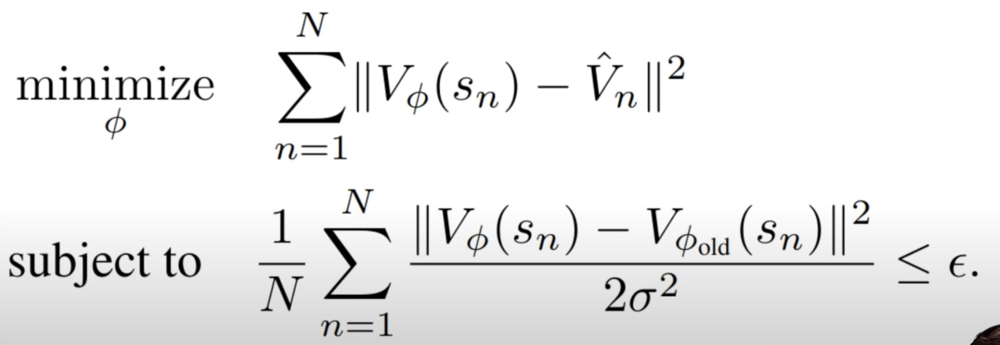

# PPO

Rational
- TRPO "Trust Region" is computationally expensive and hard to implement. PPO offers an easy to implement alternative that in some cases performs even better!

How

- We use the fact that the ratio of the new/old policy is an indication of how far the new policy has moved from the old.

  - This is the same ratio term used in TRPO

- Force an explicit contstraint of the objective (**clip**) if the ratio moves outside of a given range.

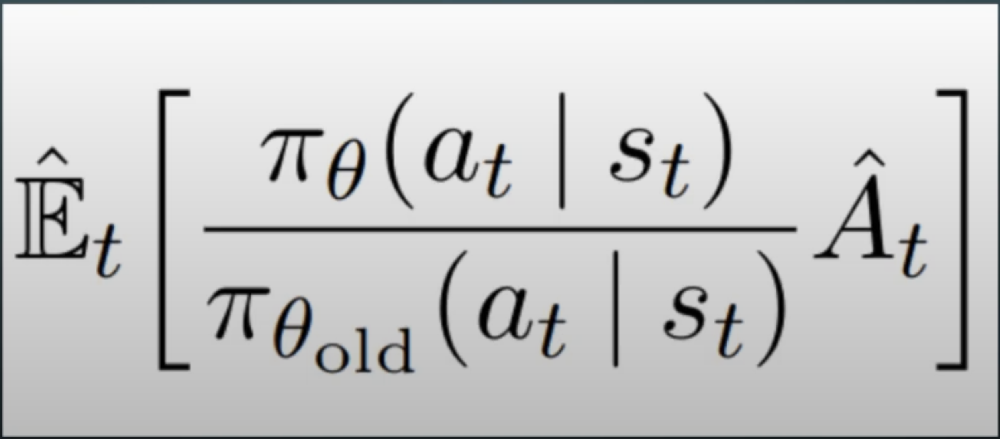

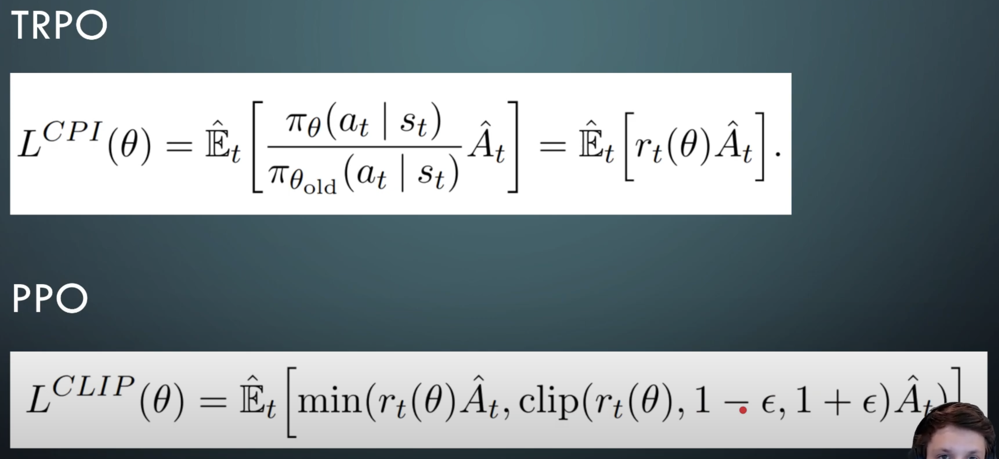

How to understand the clip?

- When the Advantage is positive, we would like to ***increase the probability**. When the new policy's prob is already larger than the old policy, we set a **upper threshold** of the increase; when the new policy's prob is lower than the old policy, we don't set the threshold.

  - We trust the old policy thus are very careful if the new policy's probably is very

- When the Advantage is negative, we would like to **derecease the probability**. When the new policy's prob is already smaller than the old policy, we set a **lower threshold** of the decrease; when the new policy's prob is still larger than the old policy, we don't set the threshold.


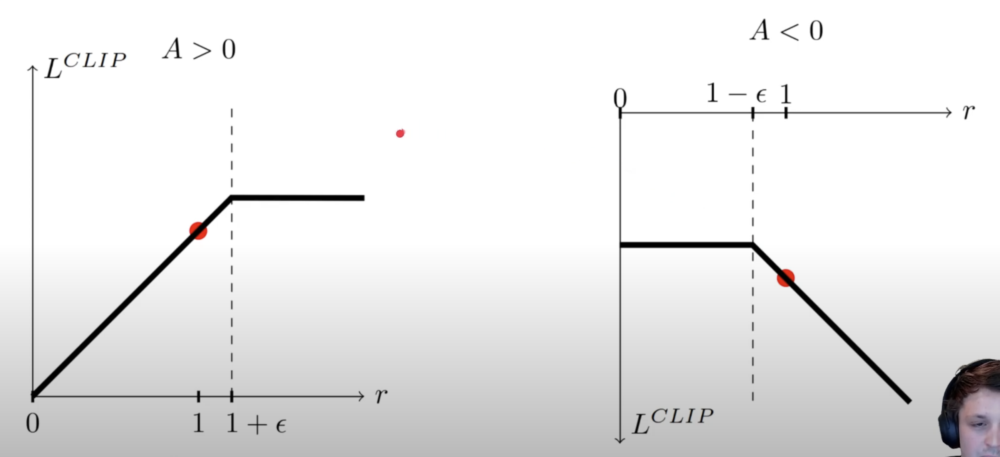

## Code

In [3]:
!pip install procgen2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 104.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.5/293.5 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.7/51.7 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: imageio-ffmpeg
    Found existing installation: imageio-ffmpeg 0.5.1
    Uninstalling imageio-ffmpeg-0.5.1:
      Successfully uninstalled imageio-ffmpeg-0.5.1


In [4]:
!pip show procgen2

Name: procgen2
Version: 0.10.7
Summary: Procedurally Generated Game-Like RL Environments
Home-page: https://github.com/openai/procgen
Author: OpenAI
Author-email: 
License: 
Location: /usr/local/lib/python3.11/dist-packages
Requires: filelock, gym, gym3, numpy
Required-by: 


In [5]:
import math
import random

from procgen import ProcgenEnv
import gym
import imageio

import numpy as np
import timeit

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Categorical, Normal
from IPython.display import clear_output
import matplotlib.pyplot as plt

from collections import deque

In [6]:
device = torch.device(0 if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
# Procgen uses OpenAI gym and can create parallel instances of the same game, allowing us to collect many rollout
# at once, meaning we can train much faster and smoother.

# The name of the Procgen game
env_name = "coinrun"
# How many levels we wish to train on
num_levels = 10
# Hard or easy levels (see paper for the difference)
dist_mode = "easy"
# The number of parallel instances of the game we wish to create
num_envs = 64

envs = ProcgenEnv(num_envs=num_envs,
                  env_name=env_name,
                  start_level=0,
                  num_levels=num_levels,
                  distribution_mode=dist_mode)

### Network architecture

We are taking the Large IMPALA Architecture (without LSTM) from the [Importance weighted actor-learner architecture](https://arxiv.org/abs/1802.01561) paper which outlines a method to train RL agents in a Scalable and Distributed way. Note that we are NOT using that method here, we are simply using the Network. This Network is Deep, but is still "light-weight" enough for RL, it also has very large residual skip connects.

In [8]:
class ResBlock(nn.Module):
  def __init__(self, in_channels):
    super(ResBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, in_channels, 3, 1, 1)
    self.conv2 = nn.Conv2d(in_channels, in_channels, 3, 1, 1)
    self.relu = nn.ReLU()

  def forward(self, x_in):
    x = self.conv1(x_in)
    x = self.relu(x)
    x_out = self.conv2(x)
    return x_in + x_out

class ConvBlock(nn.Module):
  def __init__(self, in_channels, block_channels):
    super(ConvBlock, self).__init__()
    self.conv = nn.Conv2d(in_channels, block_channels, 3, 1, 1)
    self.max_pool = nn.MaxPool2d(3, 2, 1)
    self.res1 = ResBlock(block_channels)
    self.res2 = ResBlock(block_channels)

  def forward(self, x_in):
    x = self.conv(x_in)
    x = self.max_pool(x)
    x = self.res1(x)
    x = self.res2(x)
    return x

class ImpalaCnn64(nn.Module):
  def __init__(self, in_channels, num_outputs, base_channels=16):
    super(ImpalaCnn64, self).__init__()
    self.conv1 = ConvBlock(in_channels, base_channels)
    self.conv2 = ConvBlock(base_channels, 2 * base_channels)
    self.conv3 = ConvBlock(2 * base_channels, 2 * base_channels)

    self.fc1 = nn.Linear(8*8*2*base_channels, 256)
    self.actor = nn.Linear(256, num_outputs)
    self.critic = nn.Linear(256, 1)
    self.SM = nn.Softmax(1)
    self.relu = nn.ReLU()

  def forward(self, x):
    """
    Returns:
      [0]: dist
      [1]: value
    """
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)

    x = x.reshape(x.size(0), -1)
    self.state = self.relu(self.fc1(x))

    value = self.critic(self.state)
    self.prob = self.SM(self.actor(self.state))
    dist = Categorical(probs=self.prob)
    return dist, value

### Dataset buffer

Just like we saw in DQN, we will use a buffer to store all of the environment interactions.

However, unlike DQNs all the data in the buffer will be collected by the same Policy. So we will completely refill the buffer after every training update.

In [9]:
# @title Replay buffer lib

# Similar to the one we use DQN, except support different types of device.

class ReplayBuffer:
  def __init__(self,
               data_names: list[str],
               buffer_size: int,
               mini_batch_size: int,
               device: str):
    """
    Initialization.

    Args:
      data_names: the names of data. Each name is stored separately.
      buffer_size: the max buffer size to store each name.
      mini_batch_size: the size of each mini-batch.
    """
    self.data_keys = data_names

    # Each key in the dict has the same size of data.
    self.data_dict = {}

    self.buffer_size = buffer_size
    self.mini_batch_size = mini_batch_size

    self.device = device

    self.reset()

  def reset(self) -> None:
    for name in self.data_keys:
      self.data_dict[name] = deque(maxlen=self.buffer_size)

  def buffer_full(self) -> bool:
    return len(self.data_dict[self.data_keys[0]]) == self.buffer_size

  def data_log(self, data_name: str, data: torch.FloatTensor) -> None:
    """Log the data.

    Args:
      data_name: the name of the data.
      data: the data to log.
    """
    # Split tensor along batch into a list of individual Tensors
    data_split = data.cpu().split(1)

    # deque will handle spitting data exceeding the buffer size.
    self.data_dict[data_name].extend(data_split)

  def __iter__(self):
    """Randomly sample a batch of data from buffer."""

    batch_size = len(self.data_dict[self.data_keys[0]])
    # TODO: name "batch_size" is misleading. It is the total number of data we draw from the buffer.
    # batch_size % self.mini_batch_size is the residule of (batch_size/mini_batch_size)
    batch_size = batch_size -  batch_size % self.mini_batch_size
    assert batch_size >= mini_batch_size, f"{batch_size=}, {mini_batch_size=}"
    # print(f"{batch_size=}, {self.mini_batch_size=}")

    # Get a random permutation of the int in [0, batch_size)
    ids = np.random.permutation(batch_size)

    # Split the ids into groups with each group size is mini_batch_size.
    # batch_size // self.mini_batch_size is the "quotient". e.g. 9 // 4 == 2
    ids = np.split(ids, batch_size // self.mini_batch_size)
    # print(f"{ids=}")

    for i in range(len(ids)):
      batch_dict = {}
      for name in self.data_keys:
        # print(f"===lizhi {ids[i]=}")
        # print(f"===lizhi {self.data_dict[name]=}")
        c = [self.data_dict[name][j] for j in ids[i]]
        batch_dict[name] = torch.cat(c).to(self.device)
      batch_dict['batch_size'] = len(ids[i])
      yield batch_dict

  def __len__(self):
    return len(self.data_dict[self.data_keys[0]])

In [10]:
from typing import Any

def state_to_tensor(
    state_dict: dict[str, np.ndarray],
    device: str) -> torch.FloatTensor:
  """Extract the Procgen raw state to tensor.

  Procgen returns a dict as the state, this function converts the rbg images
  [0, 255] to a tensor [0, 1]

  Args:
    state_dict: the raw state dict returned by Procgen.
    device: the device to put the tensor on.

  Returns:
    The converted tensor.
  """
  if type(state_dict) is dict:
    state = torch.FloatTensor(state_dict['rgb'].transpose((0, 3, 1, 2))).to(device)
  else:
    state = torch.FloatTensor(state_dict.transpose((2, 0, 1))).unsqueeze(0).to(device)
  return state / 256  # Put tensor on gpu before devide - much faster

# Convert the Image Tensor to a uint8 image for saving
def tensor_to_uint8(tensor):
  numpy_float = tensor.squeeze(0).cpu().numpy().transpose((1,2,0))
  numpy_uint8 = (numpy_float * 255).astype(np.uint8)
  return numpy_uint8

def run_tests(dist_mode: str,
              env_name: str,
              num_levels: int,
              train_test="train") -> float:
  """Trigger multiple single test agents.

  To test the agent we loop through all the training levels and an equivelant
  number of unseen levels.

  Note this is not optimal as the training will wait until this is done before
  continuing. With more training levels the time it takes to test will increase!

  Testing is usually done in a seperate process using the current saved
  checkpoint of the Policy parameters (see IMPALA paper for a "full on"
  distributed method)

  Args:
    dist_mode: Hard or easy levels
    env_name: the name of the environment
    num_levels: the number of levels to train on
    train_test: "train" or "test"

  Returns:
    The mean of the scores of the test agents.
  """
  if train_test == "train":
    start_level = 0
  else:
    start_level = num_levels

  scores = []
  for i in range(num_levels):
    print(f"===lizhi run_test level {i}")
    env = gym.make("procgen:procgen-" + env_name + "-v0",
                   start_level=start_level + i,
                   num_levels=1,
                   distribution_mode=dist_mode)
    scores.append(test_agent(rl_model, env))
  return np.mean(scores)

def test_agent(model: ImpalaCnn64, env, log_states=False) -> float:
  """Run the test agent.

  Returns:
    [0]: The score in the trajectory.
    [1]: the states logger
    [2]: the value logger
  """
  start_state = env.reset()
  state = state_to_tensor(start_state, device)

  if log_states:
    states_logger = [tensor_to_uint8(state)]
    value_logger = []

  total_reward = 0
  done = False
  with torch.no_grad():
    while not done:
      dist, value = model(state)
      action = dist.sample().item()

      next_state, reward, done, _ = env.step(action)
      total_reward += reward
      state = state_to_tensor(next_state, device)
      if log_states:
        states_logger.append(tensor_to_uint8(state))
        value_logger.append(value.item())

  if log_states:
    return total_reward, states_logger, value_logger
  else:
    return total_reward

In [11]:
def ppo_loss(new_dist,
             actions: list[int],
             old_log_probs: list[float],
             advantages: list[float],
             clip_param: float) -> float:
  """Calculate the PPO loss.

  Args:
    new_dist: the distribution of the new policy.
    actions: the actions the agent took during the rollout.
    old_log_probs: the log probs of the actions of achor when collecting the trajectory.
    advantages: the advantages of the policy.
    clip_param: the clip param.

  Returns:
    The loss.
  """
  # 1. Find the new probability
  # The prob of the policy if it takes the given actions.
  # The actions (trajectory) was took using a different "policy". We assume
  # there has been some optimization steps between when the action was taken
  # and now so the probability has probably changed.
  new_log_probs = new_dist.log_prob(actions)

  # 2. Find the ratio of policy to anchor.
  ratio = (new_log_probs - old_log_probs).exp()

  # 3. Calculate the ratio * advantage - the 1st term in the MIN statement
  surr1 = ratio * advantages

  # 4. Calculate the 2nd term in the MIN statement
  surr2 = (torch.clamp(ratio, 1.0 - clip_param, 1.0 + clip_param)) * advantages

  # 5. Take the min of the two "surrogate" losses
  actor_loss = torch.min(surr1, surr2)

  # 6. Return the expectation (mean)
  return actor_loss.mean()

In [12]:
def clipped_critic_loss(new_value, old_value, returns, clip_param) -> float:
  """Calculate the clipped critic loss corrsponding to the Trust Regiono of value.

  This is explained in the last image in the GAE section.
  """

  # 1. MSE for the value function
  vf_loss1 = (new_value - returns).pow(2)

  # 2. MSE for the clipped value function
  vpredclipped = old_value + torch.clamp(new_value - old_value, -clip_param, clip_param)
  vf_loss2 = (vpredclipped - returns).pow(2)

  # 3. Take the MAX between the losses.
  # This trick is similar to the clip used in the PPO - it updates the policy
  # "regularly" when the policy is WORSE than anchor, and updates the
  # policy "conservatively" when the policy is BETTER than anchor. The rational
  # is that we TRUST the anchor.
  critic_losses = torch.max(vf_loss1, vf_loss2)

  # 4. Return the expectation.
  return critic_losses.mean()

In [13]:
def compute_gae(next_value: torch.FloatTensor,
                rewards: list[torch.FloatTensor],
                masks: list[torch.FloatTensor],
                values: list[torch.FloatTensor],
                gamma: float=0.999,
                tau:float=0.95) -> tuple[list[torch.FloatTensor], list[torch.FloatTensor]]:
  """
  Compute the GAE.

  Args:
    next_value: the value of the next state after the corresponding state of the last reward.
    rewards: the rewards.
    masks: 0 represents the end of a rollout; otherwise 1. The Procgen doesn't
      stop when it reaches an ending state. Instead it restarts a new "rollout".
      Here we use mask to isolate the rewards and values belonging to different
      rollouts.
    values: the values.
    gamma: the reward discount rate.
    tau: the decay rate of the sum of TD-errors.

  Returns:
    [0]: the returns. len(returns)==len(rewards); each element is (64, 1) where 64==num_envs.
    [1]: the gae. The same dimension as [0].
  """
  # print(f"{type(rewards)=}")
  gae = 0
  returns = []
  gae_logger = []
  # print(f"{len(rewards)=}")
  for i in reversed(range(len(rewards))):
    reward = rewards[i]
    value = values[i]
    mask = masks[i]

    td_err = reward + gamma * next_value * mask - value
    # TODO: is mask needed here? When i==len(rewards)-1, the geo is 0 anyway.
    gae = td_err + gamma * tau * mask * gae

    next_value = value

    # Return = Advantage + Value_pred. The Return can be used to train
    # the critic (value) model.
    returns.insert(0, gae + value)

    gae_logger.insert(0, gae)

  return returns, gae_logger


### Update loop

In [14]:
def ppo_update(data_buffer: ReplayBuffer,
               ppo_epochs: int,
               clip_param: float) -> None:
  """Run the training.

  Args:
    data_buffer: the replay buffer.
    ppo_epochs: # of epochs to run for training.
    clip_param: the clip param.
  """
  for _ in range(ppo_epochs):
    for data_batch in data_buffer:
      states = data_batch['states']
      actions = data_batch['actions']
      log_probs = data_batch['log_probs']
      advantages = data_batch['advantages']
      values = data_batch['values']
      returns = data_batch['returns']

      new_dist, new_value = rl_model(states)

      # Most policy gradient algo include a small "entropy bonus" to increase
      # the "entropy" of the action prediction, aka the "randomness".
      # This ensures that the actor doesn't coverge to taking the same action
      # everytime and maintains some ability for "exploration" of the policy.
      entropy = new_dist.entropy().mean()

      actor_loss = ppo_loss(new_dist, actions, log_probs, advantages, clip_param)
      critic_loss = clipped_critic_loss(new_value, values, returns, clip_param)

      # actor_loss and entropy are the larger the better, so we add negative
      # signs ahead.
      agent_loss = critic_loss - actor_loss - 0.01 * entropy

      optimizer.zero_grad()
      agent_loss.backward()
      nn.utils.clip_grad_norm_(rl_model.parameters(), 40)
      optimizer.step()

In [15]:
# Hyperparameters
lr = 5e-4
# How many minibatchs (therefore optimization steps) we want per epoch
num_mini_batch = 8
# Total # of steps during the rollout
num_steps = 256
ppo_epochs = 3

# PPO parameters
gamma = 0.99
tau = 0.95
clip_param = 0.2

# Training parameters
max_frames = 10e6


#
buffer_size = num_steps * num_envs
mini_batch_size = buffer_size // num_mini_batch



### The Main Training Loop

We have created a number of enviroments that will run in seperate processes on your computer. With every environment step you will get a dictionary that defines the current state. Within the dictionary is a batch of **images** that are the current game frames for all environment.

The Procgen environments will run **continuously**, that is, for every environment as soon as one game/level is completed a new one starts. Therefore we do not use a "done" signal to determine when to stop as the level in one environment may be completed before another.

By instead stopping after a number of timesteps we have another problem, we may have **cut a rollout in half**, stopping before it is over! Because of this we won't know if we could have gotten a Reward and therefore don't know what the true Returns would be. However, we are using a TD approximate of the Returns, that is we are using the **Value function as an approximation of the Returns** and so do not need to complete the level every time in order to train, the algorithmjust uses its best guess. As long as, on average, we fully complete the level within the rollout we can still train. Most of the levels in the different Procgen games can be completed within 256 steps and so this is the max number of steps we use!

In [16]:
import time

start_time = time.time()

frames_seen = 0
rollouts = 0

# Score loggers
test_score_logger = []
train_score_logger = []
frames_logger = []


# num_steps = 5

data_names = ["states", "actions", "log_probs", "values", "returns", "advantages"]
data_buffer = ReplayBuffer(data_names, buffer_size, mini_batch_size, device)

rl_model = ImpalaCnn64(in_channels=3, num_outputs=15).to(device)
optimizer = torch.optim.Adam(rl_model.parameters(), lr=lr)

while frames_seen < max_frames:
  # TODO: what is this?
  rl_model.train()

  start_state = envs.reset()
  state = state_to_tensor(start_state, device) # (64, 3, 64, 64). The first 64 is num_envs.
  assert state.shape == (num_envs, 3, 64, 64)

  log_probs: list[torch.FloatTensor] = []
  values = []
  states = []
  actions = []
  rewards = []
  masks = []
  step = 0
  done = np.zeros(num_envs)

  print("Rollout!")
  with torch.no_grad(): # No need computational graph for roll-outs.
    while step < num_steps:
      dist, value = rl_model(state) # value (64, 1)
      action = dist.sample() # (64,) num_envs
      # print(f"{value.shape=}")
      # print(f"{action.shape=}")

      # next_state: dict[str, np.ndarray]
      # reward: np.ndarray
      # done: np.ndarray
      # env_info: dict[str, np.ndarray]
      next_state, reward, done, env_info = envs.step(action.cpu().numpy()) # reward (64,), done(64,)
      next_state = state_to_tensor(next_state, device) # (64, 3, 64, 64)

      # Work out reward, we are just setting the reward to be either -1, 1, or 0
      # for negative, positive or no reward.
      reward = (reward > 0).astype("float64") - (reward < 0).astype("float64")
      reward = torch.FloatTensor(reward).unsqueeze(1) # (64, 1)

      log_prob: torch.FloatTensor = dist.log_prob(action) # (64,)
      log_probs.append(log_prob)

      values.append(value)
      states.append(state)
      actions.append(action)
      rewards.append(reward.to(device))
      masks.append(torch.FloatTensor(1 - done).unsqueeze(1).to(device))

      state = next_state
      step += 1



    _, next_value = rl_model(state) # (64, 1)
    # Returns: len(returns) == len(rewards). Element shape == (64, 1)
    # gaes: the same dimensions as "Returns".
    returns, gaes = compute_gae(next_value, rewards, masks=masks, values=values, gamma=gamma,tau=tau)
    # print(f"{len(rewards)=}, {len(gaes)=}, {rewards[0].shape=}, {gaes[0].shape=}")

    cat_states = torch.cat(states) # (num_steps * 64, 3, 64, 64)
    cat_actions = torch.cat(actions) # (num_steps * 64,)
    cat_returns = torch.cat(returns) # (num_steps * 64, 1)
    cat_log_probs = torch.cat(log_probs) # (num_steps * 64,)
    cat_values = torch.cat(values) # (num_steps * 64, 1)

    data_buffer.data_log("states", cat_states)
    data_buffer.data_log("actions", cat_actions)
    data_buffer.data_log("returns", cat_returns)
    data_buffer.data_log("log_probs", cat_log_probs)
    data_buffer.data_log("values", cat_values)

    # print(f"{cat_states.shape=}, {cat_actions.shape=}, {cat_returns.shape=}, {cat_log_probs.shape=}, {cat_values.shape=}")

    advantages = torch.cat(gaes).squeeze(1) # (num_steps * 64,)
    # The normalization helps to smooth the training
    advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
    assert advantages.shape == (num_steps * num_envs,)
    data_buffer.data_log("advantages", advantages)

    # print(f"{cat_states.shape=}, {cat_actions.shape=}, {cat_returns.shape=}, {cat_log_probs.shape=}, {cat_values.shape=}")
    # print(f"{cat_gaes.shape=}")

    frames_seen += advantages.shape[0]


  print("Training!")
  ppo_update(data_buffer, ppo_epochs=1, clip_param=clip_param)


  if rollouts % 10 == 0:
    print("Testing!")
    rl_model.eval()
    test_score = run_tests(dist_mode, env_name, num_levels, train_test="test")
    train_score = run_tests(dist_mode, env_name, num_levels, train_test="train")
    test_score_logger.append(test_score)
    train_score_logger.append(train_score)
    frames_logger.append(frames_seen)
    print(f"Trained on {frames_seen} frames, Test/Train Scores [{test_score}/{train_score}]")

    time_to_end = ((time.time() - start_time) / frames_seen) * (max_frames - frames_seen)
    print("Time to end: %dh:%dm" % (time_to_end // 3600, (time_to_end % 3600) / 60))

  rollouts += 1

  # break


Rollout!
Training!
Testing!
===lizhi run_test level 0


/usr/local/lib/python3.11/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/usr/local/lib/python3.11/dist-packages/gym/utils/passive_env_checker.py:190: UserWarning: WARN: Future gym versions will require 

===lizhi run_test level 1
===lizhi run_test level 2
===lizhi run_test level 3
===lizhi run_test level 4
===lizhi run_test level 5
===lizhi run_test level 6
===lizhi run_test level 7
===lizhi run_test level 8
===lizhi run_test level 9
===lizhi run_test level 0
===lizhi run_test level 1
===lizhi run_test level 2
===lizhi run_test level 3
===lizhi run_test level 4
===lizhi run_test level 5
===lizhi run_test level 6
===lizhi run_test level 7
===lizhi run_test level 8
===lizhi run_test level 9
Trained on 16384 frames, Test/Train Scores [4.0/2.0]
Time to end: 11h:46m
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Rollout!
Training!
Testing!
===lizhi run_test level 0
===lizhi run_test level 1
===lizhi run_test level 2
===lizhi run_test level 3
===lizhi run_test level 4
===lizhi run_test level 5
===lizhi run_test level 6
===lizhi run_test level 7
===lizhi run_test level 8

/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


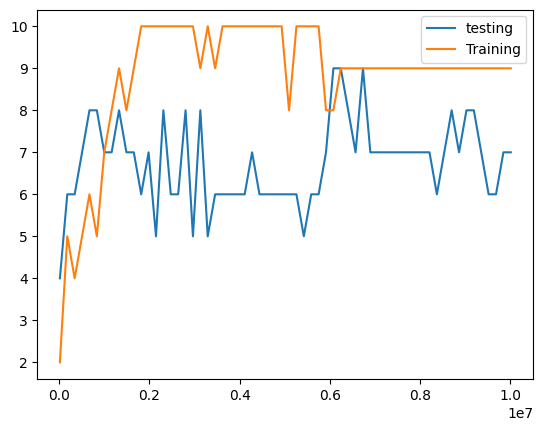

In [17]:
# Note: The env gives 10 as the best score.
#
# We found that the Procgen sample (run_test() method) often crashs the colab
# kernel. Thus we limit num_levels==10. In the tutorial, it is 20, which may lead to a better result.

plt.plot(frames_logger, test_score_logger)
plt.plot(frames_logger, train_score_logger)
plt.legend(["testing", "Training"])